<a href="https://colab.research.google.com/github/yeesem/Advanced-Tensorflow-Specialization/blob/main/Alternative_Assessment_Handwriting_Recognization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [26]:
import numpy as np
import pandas as pd
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import os
import cv2
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.utils import plot_model
import tensorflow.keras.backend as K

# Distributed Training

In [27]:
# Detect hardware
try:
  # TPU Detector
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
except ValueError:
  tpu = None
  gpus = tf.config.experimental.list_logical_devices("GPU")

# Select appropriate distribution strategy
if tpu:
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.experimental.TPUStrategy(tpu)
  print("Running on TPU ")
elif len(gpus) > 1:
  strategy = tf.distribute.MirroredStrategy([gpu.name for gpu in gpus])
  print("Running on multiple GPUs ",[gpu.name for gpu in gpus])
elif len(gpus) == 1:
  # strategy for single-machine execution
  strategy = tf.distribute.get_strategy()
  print("Running on single GPU ",gpus[0].name)
else:
  # strategy for single-machine execution
  strategy = tf.distribute.get_strategy()
  print("Running on single CPU ")

print("Number of accelerators ",strategy.num_replicas_in_sync)

Running on single GPU  /device:GPU:0
Number of accelerators  1


# Dataset Loading and Preprocessing

In [28]:
!git clone https://github.com/Walmond3/WIX3001-Alt-Ass

fatal: destination path 'WIX3001-Alt-Ass' already exists and is not an empty directory.


**Image Cropping**

In [29]:
def crop_image_into_pieces(image_path, output_folder, rows, columns, owner):
    # Open the image
    image = Image.open(image_path)

    # Convert image to RGB mode (remove alpha channel)
    image = image.convert("RGB")

    # Get the dimensions of the original image
    original_width, original_height = image.size

    # Calculate the width and height of each piece
    piece_width = original_width // columns
    piece_height = original_height // rows

    # Initialize a list to store data for each cropped image
    cropped_images_data = []

    # Iterate through each row and column
    for row in range(rows):
        for col in range(columns):
            # Calculate the coordinates for cropping
            left = col * piece_width
            upper = row * piece_height
            right = left + piece_width
            lower = upper + piece_height

            # Crop the image
            cropped_img = image.crop((left, upper, right, lower))

            # Invert the colors
            inverted_img = ImageOps.invert(cropped_img)

            # Create output subfolder if it doesn't exist
            os.makedirs(output_folder, exist_ok=True)

            # Save the cropped image
            output_filename = f"{owner}_crop_{row}_{col}.jpg"
            output_filepath = os.path.join(output_folder, output_filename)
            inverted_img.save(output_filepath)

            # Append data to the list for DataFrame
            cropped_images_data.append({
                "Filename": output_filename,
                "Filepath": output_filepath,
                "Owner": owner
            })
            # print(f"Saved {output_filename}")

    print(f"All crops for {owner} saved!")

    return cropped_images_data

# Directory where the images are stored
images_directory = "/content/WIX3001-Alt-Ass/Handwriting"

# Output folder to save cropped images within Colab
output_folder = "/content/output_crops"

# Number of rows and columns in the grid
rows = 12
columns = 12

# Check if the images directory exists
if not os.path.exists(images_directory):
    print(f"Error: {images_directory} does not exist.")
    exit()

# List all files in the images directory
image_files = os.listdir(images_directory)

# Check if there are any image files
if not image_files:
    print(f"No image files found in {images_directory}.")
    exit()

# Initialize a list to store all cropped images data
all_cropped_images_data = []

# Iterate through each image file
for image_file in image_files:
    image_path = os.path.join(images_directory, image_file)
    owner, _ = os.path.splitext(image_file)  # Get owner from filename without extension
    cropped_images_data = crop_image_into_pieces(image_path, output_folder, rows, columns, owner)

    # Testing
    all_cropped_images_data.extend(cropped_images_data)

All crops for Hui Yi saved!
All crops for Yan Ho saved!
All crops for Yan Hao saved!
All crops for Yee Sem saved!
All crops for Jin Khye saved!


**Store data in DataFrame**

In [30]:
# Create a DataFrame from the list of cropped images data
df = pd.DataFrame(all_cropped_images_data)
df.head()

,Filename,Filepath,Owner
0,Hui Yi_crop_0_0.jpg,/content/output_crops/Hui Yi_crop_0_0.jpg,Hui Yi
1,Hui Yi_crop_0_1.jpg,/content/output_crops/Hui Yi_crop_0_1.jpg,Hui Yi
2,Hui Yi_crop_0_2.jpg,/content/output_crops/Hui Yi_crop_0_2.jpg,Hui Yi
3,Hui Yi_crop_0_3.jpg,/content/output_crops/Hui Yi_crop_0_3.jpg,Hui Yi
4,Hui Yi_crop_0_4.jpg,/content/output_crops/Hui Yi_crop_0_4.jpg,Hui Yi


**Display Images**

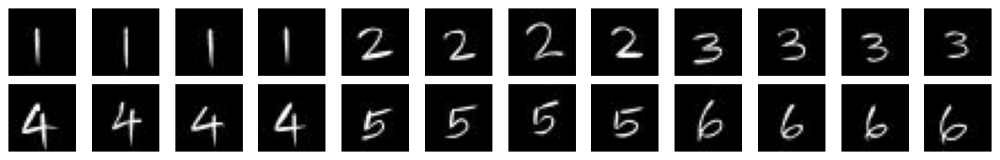

In [31]:
def display_images(filepaths):
    fig, axes = plt.subplots(len(filepaths) // columns, columns, figsize=(12, 2))
    for i, filepath in enumerate(filepaths):
        img = Image.open(filepath)
        ax = axes[i // columns, i % columns]
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


# Display the images
display_images(df['Filepath'][:24])

**Dataset spliting**

In [32]:
from sklearn.model_selection import train_test_split


train,test = train_test_split(df,test_size=0.1, random_state=42)

In [33]:
# Load Images
def load_and_preprocess_image(file_path):
    # Read the image file as raw data
    img = tf.io.read_file(file_path)
    # Decode the raw data into a tensor
    img = tf.image.decode_image(img, channels=3)

    img = tf.cast(img, tf.float32) / 255.0

    img = tf.image.resize(img,(150,150))

    return img

label_mapping = {'Yan Ho' : 0,'Jin Khye' : 1,'Hui Yi' : 2,'Yee Sem' : 3,'Yan Hao' : 4}

# Train dataset
train_image_paths = train['Filepath'].tolist()
train_label = np.array(train['Owner'].map(label_mapping))

# Test dataset
test_image_paths = test['Filepath'].tolist()
test_label =  np.array(test['Owner'].map(label_mapping))

# Load all images
train_images = [load_and_preprocess_image(path) for path in train_image_paths]
train_image_dataset = tf.data.Dataset.from_tensor_slices((train_images,train_label))

test_images = [load_and_preprocess_image(path) for path in test_image_paths]
test_image_dataset = tf.data.Dataset.from_tensor_slices((test_images,test_label))

In [34]:
train_batch_size = 32
test_batch_size = 4
train_dataset = train_image_dataset.shuffle(buffer_size=len(train)).batch(train_batch_size)
test_dataset = test_image_dataset.batch(test_batch_size)

In [35]:
class_names = list(df["Owner"].unique())
class_names

['Hui Yi', 'Yan Ho', 'Yan Hao', 'Yee Sem', 'Jin Khye']

# Define the Model

**Display images**

In [94]:
import matplotlib as mpl
def get_image_ypred_ytrue(model_1,test_dataset):
    x_batches,y_pred_batches,y_true_batches = [],[],[]

    for x, y in test_dataset:
      y_pred = model_1(x)
      y_pred_batches.append(y_pred)
      y_true_batches.append(y)
      x_batches.append(x)

    x_batches = np.concatenate(x_batches)
    y_pred_batches = np.concatenate(y_pred_batches)
    y_true_batches = np.concatenate(y_true_batches)

    indexes = np.random.choice(len(y_pred_batches), size=10)
    images_to_plot = x_batches[indexes]
    y_pred_to_plot = y_pred_batches[indexes]
    y_true_to_plot = y_true_batches[indexes]

    y_pred_labels = [class_names[np.argmax(sel_y_pred)] for sel_y_pred in y_pred_to_plot]
    y_true_labels = [class_names[sel_y_true] for sel_y_true in y_true_to_plot]

    return images_to_plot,y_pred_labels,y_true_labels

def display_images(images, predictions, labels, title, n):
    mpl.rcParams.update(mpl.rcParamsDefault)
    fig, axes = plt.subplots(1, n, figsize=(17, 3))
    fig.suptitle(title)

    for i in range(n):
        axes[i].imshow(images[i])
        if predictions[i] == labels[i]:
          color = 'green'
        else:
          color = 'red'
        axes[i].title.set_color(color)
        axes[i].set_title(f"Pred: {predictions[i]}\nTrue: {labels[i]}")
        axes[i].axis('off')

    plt.show()

def display_images_with_cam(images, predictions, labels, title, n):
    mpl.rcParams.update(mpl.rcParamsDefault)
    fig, axes = plt.subplots(2, n, figsize=(17, 4.6))
    # fig.subplots_adjust(top=0.3)
    fig.suptitle(title)

    for i in range(n):
        axes[0,i].imshow(images[i])
        if predictions[i] == labels[i]:
          color = 'green'
        else:
          color = 'red'
        axes[0,i].title.set_color(color)
        axes[0,i].set_title(f"Pred: {predictions[i]}\nTrue: {labels[i]}")
        axes[0,i].axis('off')

        super_imposed_image = show_sample(inceptionv3_model,images[i],labels[i],layer_name = 'mixed10')
        axes[1,i].imshow(super_imposed_image)
        axes[1,i].axis('off')

    plt.show()


**Define Optimizers and Loss function**

In [37]:
# Define Optimizer and Loss Function
learning_rate = 0.0001
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy()

# Define metrics
train_acc_metrics = tf.keras.metrics.SparseCategoricalAccuracy()
test_acc_metrics = tf.keras.metrics.SparseCategoricalAccuracy()

**Define gradient and training loop**

In [38]:
def apply_gradient(model_1,optimizer,loss_object,x,y):
  with tf.GradientTape() as tape:
    pred = model_1(x)
    loss_value = loss_object(y_true = y,y_pred = pred)

  gradients = tape.gradient(loss_value,model_1.trainable_weights)
  optimizer.apply_gradients(zip(gradients,model_1.trainable_weights))

  return pred,loss_value

In [39]:
def perform_validation(model_1,test_dataset):
  losses = []
  for x_val,y_val in test_dataset:
    val_logits = model_1(x_val)
    val_loss = loss_object(y_true = y_val,y_pred = val_logits)

    losses.append(val_loss)
    test_acc_metrics(y_val,val_logits)

  return losses

In [40]:
def train_data_for_one_epoch(model_1,train_dataset):
  losses = []

  pbar = tqdm(total = len(list(enumerate(train_dataset))),position = 0, leave = True, bar_format = '{l_bar}{bar} | {n_fmt}/{total_fmt}')
  for step,(x_batch_train,y_batch_train) in enumerate(train_dataset):
    pred,loss_value = apply_gradient(model_1,optimizer,loss_object,x_batch_train,y_batch_train)
    losses.append(loss_value)

    train_acc_metrics(y_batch_train,pred)
    pbar.set_description("Training loss for step %s: %.4f" % (int(step),float(loss_value)))
    pbar.update()


  return losses

**Transfer Learning**

In [41]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2024-06-05 14:47:59--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.118.207, 74.125.200.207, 74.125.130.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.118.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  23.1MB/s    in 4.8s    

2024-06-05 14:48:04 (17.5 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [90]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import optimizers
from tensorflow.keras import Model
from tensorflow.keras import layers

def feature_extractor_inceptionV3_Resnet50(type_ = 'inceptionv3'):
  if type_ == 'inceptionv3':
      # Set the weights file you downloaded into a variable
      local_weights_file = "/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5"

      # Initialize the base model
      # Set the input shape and remove the dense layer
      feature_extractor = InceptionV3(input_shape = (150,150,3),
                                      include_top = False,
                                      weights = None)
      # Load the pre-trained weights
      feature_extractor.load_weights(local_weights_file)

      # Freeze the weights of the layers
      for layer in feature_extractor.layers:
        if layer.name == 'mixed9':
          break
        layer.trainable = False

  elif type_ == 'resnet50':
      feature_extractor = tf.keras.applications.resnet.ResNet50(
        input_shape = (150,150,3),
        include_top = False,
        weights = 'imagenet'
      )

      # Freeze the weights of the layers
      for layer in feature_extractor.layers[:-4]:
        layer.trainable = False

  return feature_extractor,feature_extractor.output

def classifier(inputs,type_ = 'inceptionv3'):
  if type_ == 'inceptionv3':
    #x = layers.GlobalAveragePooling2D()(inputs)
    x = layers.Flatten()(inputs)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(1024,activation = 'relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(512,activation = 'relu')(x)
    x = layers.Dropout(0.3)(x)
  elif type_ == 'resnet50':
    x = layers.Flatten()(inputs)
    x = layers.Dense(1024,activation = 'relu')(x)
    x = layers.Dense(512,activation = 'relu')(x)

  x = layers.Dense(5,activation = 'softmax')(x)

  return x

def model_1(type_):
  feature_extractor,model = feature_extractor_inceptionV3_Resnet50(type_)
  classification_output = classifier(model,type_)
  model = Model(inputs = feature_extractor.input,outputs = classification_output)
  return model

def train_model(model_1,train_dataset,test_dataset,epochs = 30):

  epochs_test_losses,epochs_train_losses = [],[]
  epochs_test_acc,epochs_train_acc = [],[]

  for epoch in range(epochs):
    current_epoch = epoch+1
    print("Epoch : ",current_epoch)

    losses_train = train_data_for_one_epoch(model_1,train_dataset)
    train_acc = train_acc_metrics.result()

    losses_test = perform_validation(model_1,test_dataset)
    test_acc = test_acc_metrics.result()

    losses_train_mean = np.mean(losses_train)
    losses_test_mean = np.mean(losses_test)
    epochs_train_losses.append(losses_train_mean)
    epochs_test_losses.append(losses_test_mean)

    epochs_train_acc.append(train_acc)
    epochs_test_acc.append(test_acc)

    print("Train loss : {:8.4f}, Validation loss : {:8.4f}, Train Accuracy : {:6.3f}, Test Accuracy : {:6.3f}\n".format(
        float(losses_train_mean),float(losses_test_mean),float(train_acc),float(test_acc)
    ))

    images,y_true,y_pred = get_image_ypred_ytrue(model_1,test_dataset)

    display_train_acc = round(float(train_acc),3)
    display_test_acc = round(float(test_acc),3)
    display_images(images, y_pred, y_true, f"Predicted and True Values : Epoch {current_epoch}, Train Accuracy {display_train_acc}, Test Accuracy {display_test_acc}", 10)

    print("\n")

    train_acc_metrics.reset_states()
    test_acc_metrics.reset_states()

  history = {
      'accuracy' : epochs_train_acc,
      'test_accuracy' : epochs_test_acc,
      'loss' : epochs_train_losses,
      'test_loss' : epochs_test_losses
  }

  return history

# Resnet50

Model: "model_125"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 156, 156, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 75, 75, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 75, 75, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                      

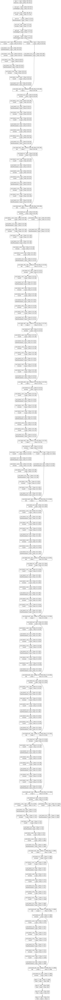

In [91]:
model_1 = model_1('resnet50')
model_1.summary()
plot_model(model_1,show_shapes=True, show_layer_names=True)

# Resnet50 - Model Training

Epoch :  1


Training loss for step 20: 0.2412: 100%|██████████ | 21/21


Train loss :   0.1200, Validation loss :   0.1000, Train Accuracy :  0.961, Test Accuracy :  0.972



  0%|           | 0/21


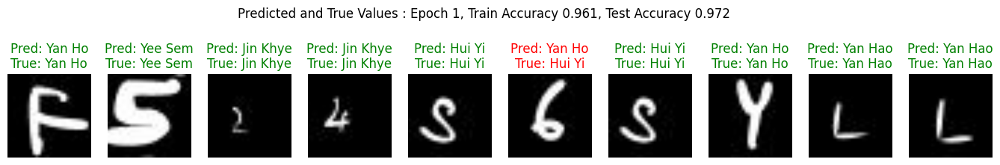



Epoch :  2


Training loss for step 20: 0.0373: 100%|██████████ | 21/21


Train loss :   0.1075, Validation loss :   0.0825, Train Accuracy :  0.963, Test Accuracy :  0.986



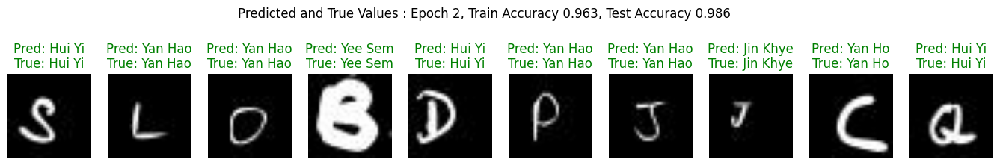



Epoch :  3


Training loss for step 20: 0.0210: 100%|██████████ | 21/21


Train loss :   0.0878, Validation loss :   0.0745, Train Accuracy :  0.975, Test Accuracy :  0.986



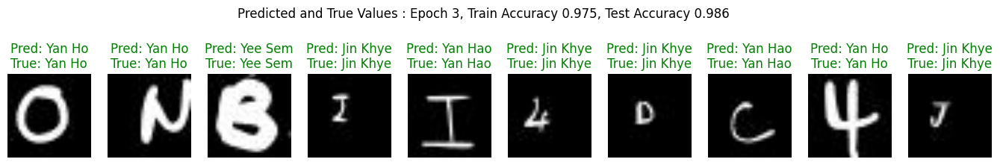



Epoch :  4


Training loss for step 20: 0.0404: 100%|██████████ | 21/21


Train loss :   0.0701, Validation loss :   0.1879, Train Accuracy :  0.977, Test Accuracy :  0.931



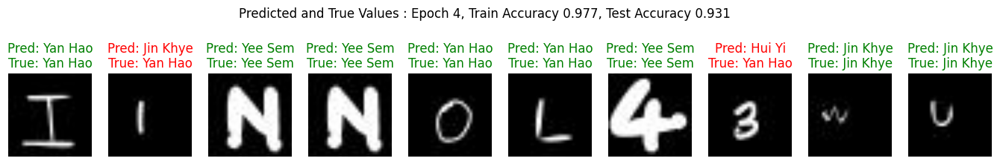



Epoch :  5


Training loss for step 20: 0.0043: 100%|██████████ | 21/21


Train loss :   0.0808, Validation loss :   0.0646, Train Accuracy :  0.983, Test Accuracy :  0.986



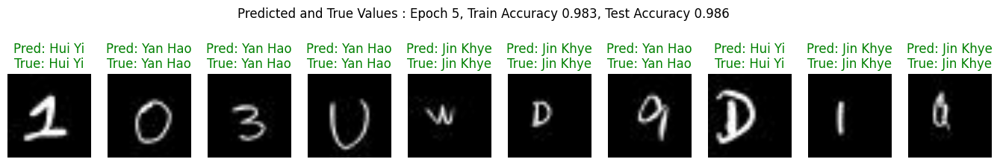



Epoch :  6


Training loss for step 20: 0.0303: 100%|██████████ | 21/21


Train loss :   0.0660, Validation loss :   0.0507, Train Accuracy :  0.975, Test Accuracy :  0.986



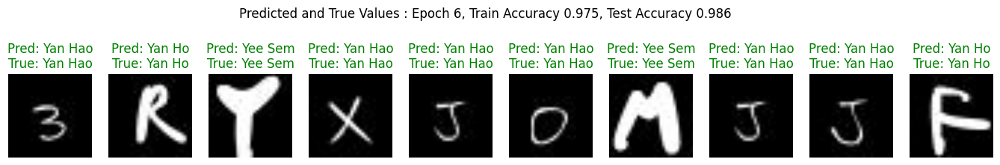



Epoch :  7


Training loss for step 20: 0.0070: 100%|██████████ | 21/21


Train loss :   0.0424, Validation loss :   0.0387, Train Accuracy :  0.992, Test Accuracy :  1.000



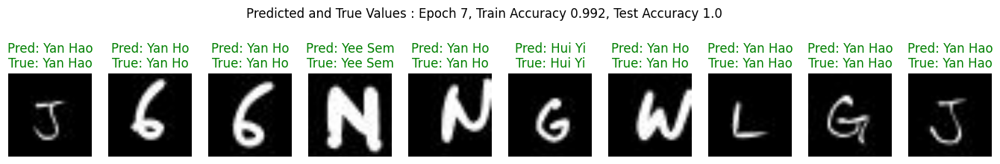



Epoch :  8


Training loss for step 20: 0.0210: 100%|██████████ | 21/21


Train loss :   0.0390, Validation loss :   0.0502, Train Accuracy :  0.994, Test Accuracy :  0.986



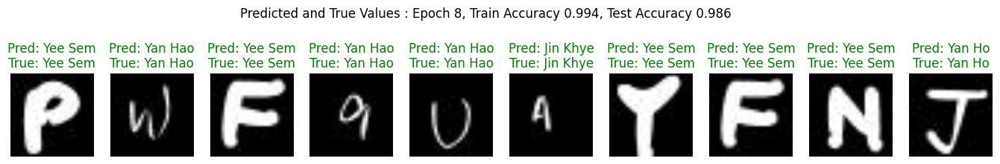



Epoch :  9


Training loss for step 20: 0.0467: 100%|██████████ | 21/21


Train loss :   0.0508, Validation loss :   0.0444, Train Accuracy :  0.981, Test Accuracy :  0.986



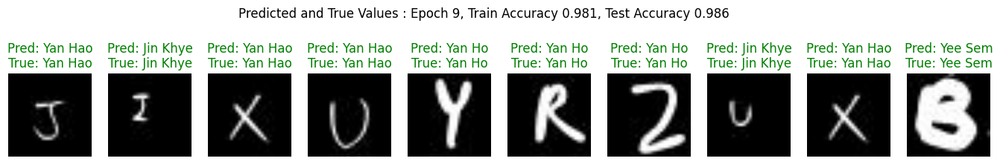



Epoch :  10


Training loss for step 20: 0.1463: 100%|██████████ | 21/21


Train loss :   0.0442, Validation loss :   0.0573, Train Accuracy :  0.989, Test Accuracy :  0.972



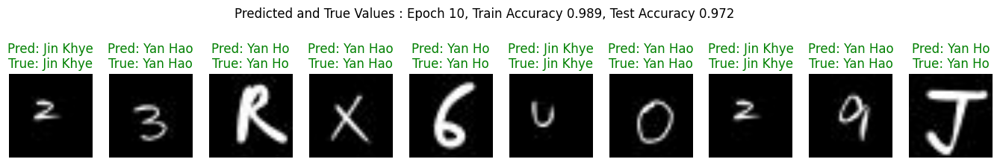



Epoch :  11


Training loss for step 20: 0.0409: 100%|██████████ | 21/21


Train loss :   0.0343, Validation loss :   0.0354, Train Accuracy :  0.995, Test Accuracy :  0.986



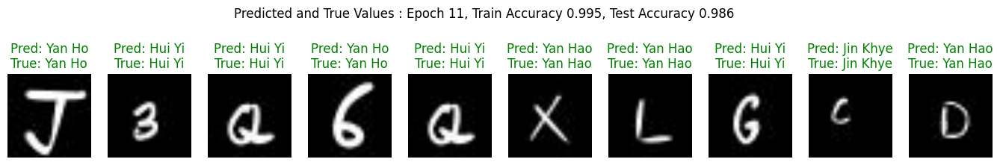



Epoch :  12


Training loss for step 20: 0.0509: 100%|██████████ | 21/21


Train loss :   0.0334, Validation loss :   0.0350, Train Accuracy :  0.994, Test Accuracy :  0.986



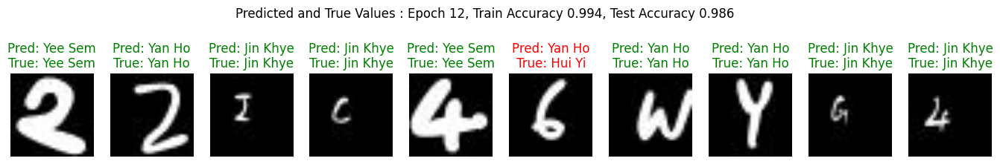



Epoch :  13


Training loss for step 20: 0.0050: 100%|██████████ | 21/21


Train loss :   0.0264, Validation loss :   0.0684, Train Accuracy :  0.995, Test Accuracy :  0.972



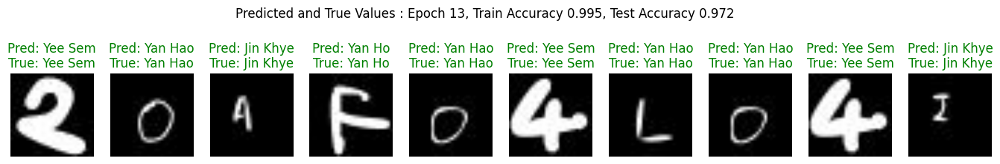



Epoch :  14


Training loss for step 20: 0.0077: 100%|██████████ | 21/21


Train loss :   0.0309, Validation loss :   0.0468, Train Accuracy :  0.992, Test Accuracy :  0.986



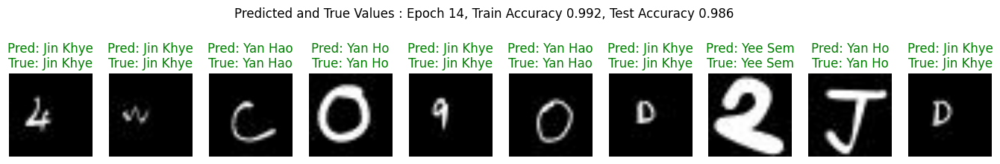



Epoch :  15


Training loss for step 20: 0.0038: 100%|██████████ | 21/21


Train loss :   0.0224, Validation loss :   0.0551, Train Accuracy :  0.997, Test Accuracy :  0.986



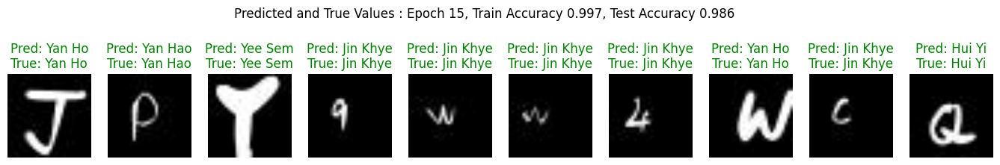

In [95]:
history = train_model(model_1,train_dataset,test_dataset,epochs = 15)

#Resnet50 -  Visualize Results

### GradCAM

In [96]:
def get_CAM(model, preprocessed_image, actual_label, layer_name):
    ## First, we create a model that maps the input image to the activations
    ## of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        model.inputs, [model.get_layer(layer_name).output, model.output]
    )

    ## Then, we compute the gradient of the top predicted class for our input image
    ## for the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(preprocessed_image)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    ## We are doing transfer learning on last layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    ## This is a vector where each entry is the mean intensity of the gradient
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    ## calculates a heatmap highlighting the regions of importance in an image
    ## for a specific
    ## predicted class by combining the output of the last convolutional layer
    ## with the pooled gradients.
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    ## For visualization purpose
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [97]:
def show_sample(model,sample_image,sample_label,layer_name ):
  sample_image_processed = np.expand_dims(sample_image,axis = 0)

  activations = model.predict(sample_image_processed)

  pred_label = np.argmax(model.predict(sample_image_processed),axis = -1)[0]

  heatmap = get_CAM(model,sample_image_processed,sample_label,layer_name)

  heatmap = cv2.resize(heatmap,
                       (sample_image.shape[0],sample_image.shape[1]))

  heatmap *= 255

  heatmap = np.clip(heatmap,0,255).astype(np.uint8)

  heatmap = cv2.applyColorMap(heatmap,cv2.COLORMAP_HOT)

  super_imposed_image = cv2.addWeighted(
      sample_image,
      0.8,
      heatmap.astype('float32'),
      2e-3,
      0.0
  )

  return super_imposed_image

### Visualize Loss and Accuracy

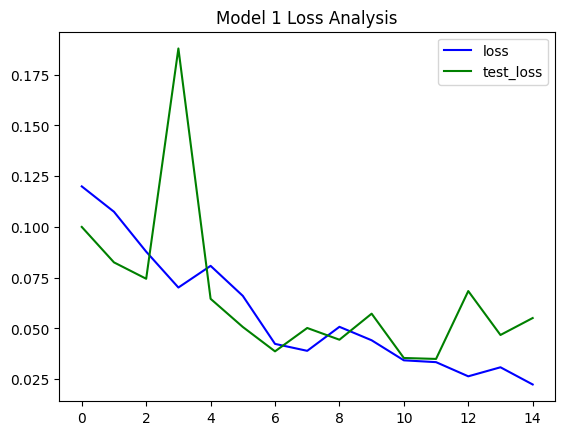

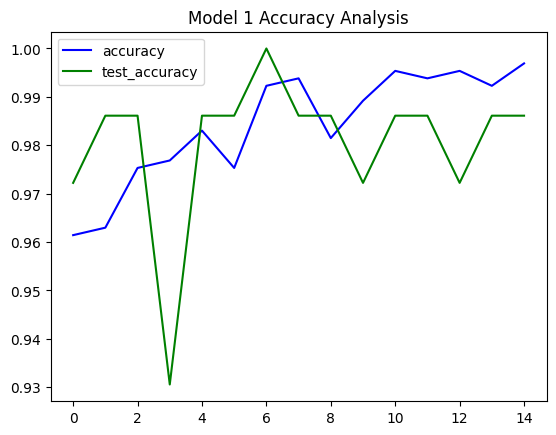

In [98]:
def plot_metrics(history,metric_name, title):
    plt.title(title)
    plt.plot(history[metric_name],color='blue',label=metric_name)
    plt.plot(history['test_' + metric_name],color='green',label='test_' + metric_name)
    plt.legend()
    plt.show()

plot_metrics(history,'loss','Model 1 Loss Analysis')
print()
plot_metrics(history,'accuracy','Model 1 Accuracy Analysis')

###Resnet50 - Visualize Predictions

1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 25ms/step


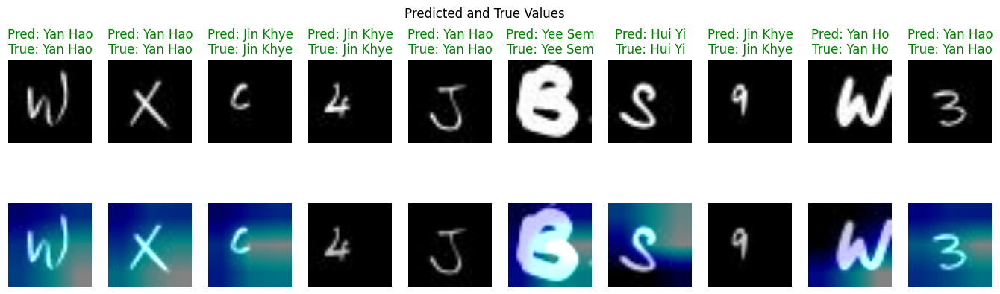

In [99]:
images_to_plot,y_pred_labels,y_true_labels = get_image_ypred_ytrue(model_1,test_dataset)
display_images_with_cam(images_to_plot, y_pred_labels, y_true_labels, "Predicted and True Values", 10)

# InceptionV3

In [53]:
type_ = 'inceptionv3'
inceptionv3_model = model_1('inceptionv3')
inceptionv3_model.summary()
plot_model(inceptionv3_model,show_shapes=True, show_layer_names=True)

Model: "model_22"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 74, 74, 32)           864       ['input_3[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 74, 74, 32)           96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 74, 74, 32)           0         ['batch_normalization[0

Epoch :  1


Training loss for step 20: 0.6637: 100%|██████████ | 21/21


Train loss :   0.7462, Validation loss :   0.0730, Train Accuracy :  0.765, Test Accuracy :  0.958



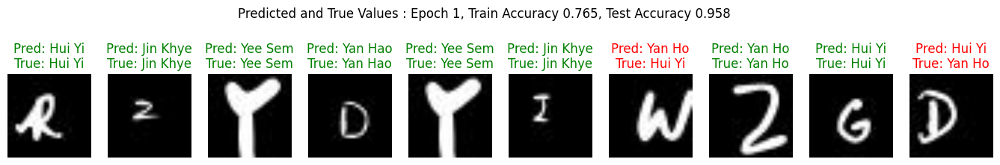



Epoch :  2


Training loss for step 20: 0.4896: 100%|██████████ | 21/21


Train loss :   0.1069, Validation loss :   0.1132, Train Accuracy :  0.969, Test Accuracy :  0.958



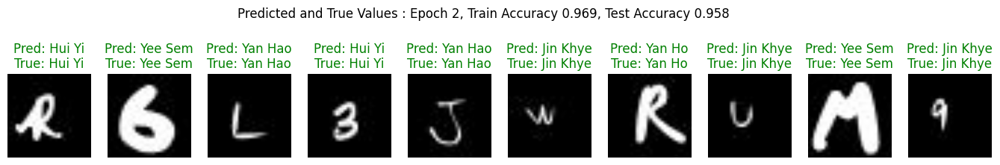



Epoch :  3


Training loss for step 20: 0.2391: 100%|██████████ | 21/21


Train loss :   0.0763, Validation loss :   0.0906, Train Accuracy :  0.975, Test Accuracy :  0.972



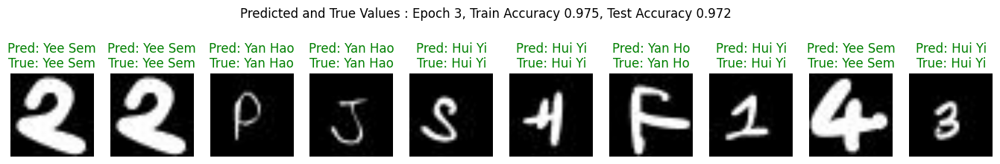



Epoch :  4


Training loss for step 20: 0.0365: 100%|██████████ | 21/21


Train loss :   0.0341, Validation loss :   0.0303, Train Accuracy :  0.986, Test Accuracy :  0.986



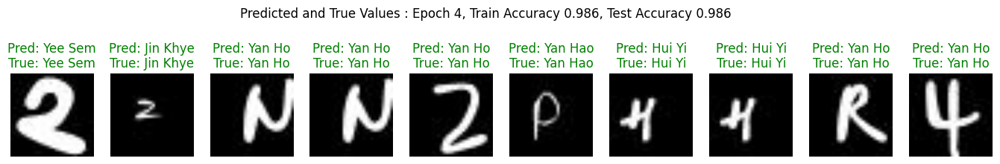



Epoch :  5


Training loss for step 20: 0.0048: 100%|██████████ | 21/21


Train loss :   0.0024, Validation loss :   0.0425, Train Accuracy :  1.000, Test Accuracy :  0.972



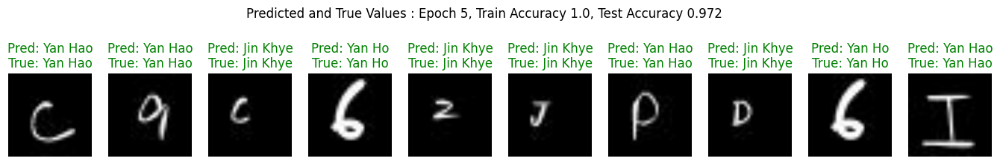



Epoch :  6


Training loss for step 20: 0.0014: 100%|██████████ | 21/21


Train loss :   0.0047, Validation loss :   0.0178, Train Accuracy :  0.998, Test Accuracy :  1.000



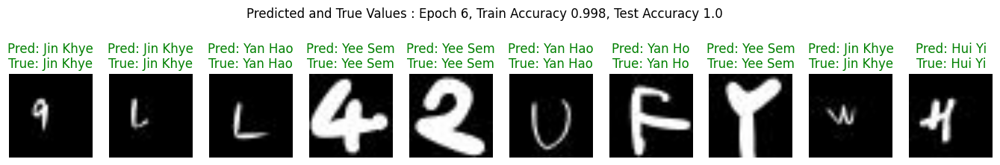



Epoch :  7


Training loss for step 20: 0.0001: 100%|██████████ | 21/21


Train loss :   0.0015, Validation loss :   0.0143, Train Accuracy :  1.000, Test Accuracy :  1.000



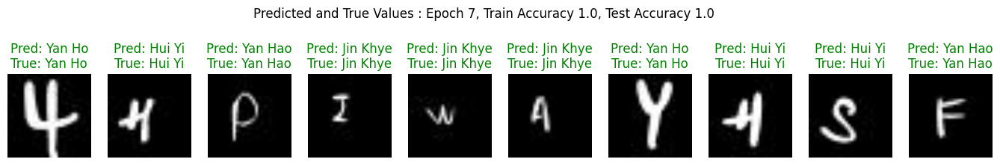



Epoch :  8


Training loss for step 20: 0.0002: 100%|██████████ | 21/21


Train loss :   0.0004, Validation loss :   0.0136, Train Accuracy :  1.000, Test Accuracy :  1.000



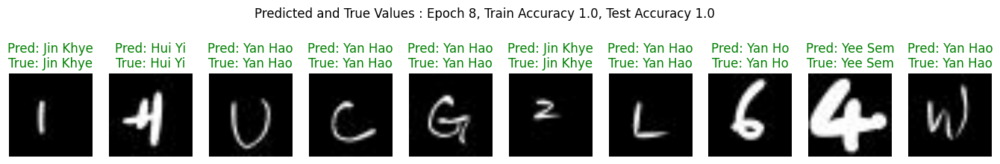



Epoch :  9


Training loss for step 20: 0.0000: 100%|██████████ | 21/21


Train loss :   0.0003, Validation loss :   0.0150, Train Accuracy :  1.000, Test Accuracy :  1.000



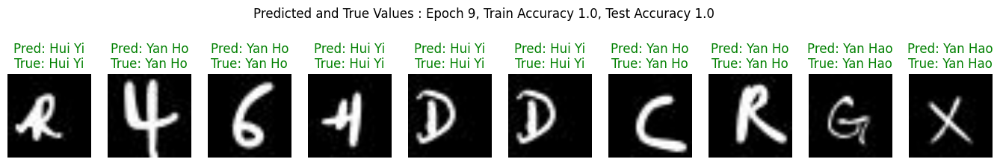



Epoch :  10


Training loss for step 20: 0.0001: 100%|██████████ | 21/21


Train loss :   0.0002, Validation loss :   0.0147, Train Accuracy :  1.000, Test Accuracy :  1.000



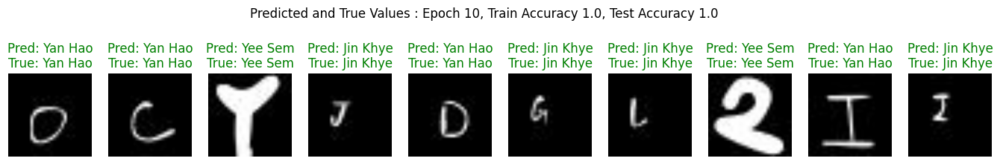



Epoch :  11


Training loss for step 20: 0.0002: 100%|██████████ | 21/21


Train loss :   0.0002, Validation loss :   0.0146, Train Accuracy :  1.000, Test Accuracy :  1.000



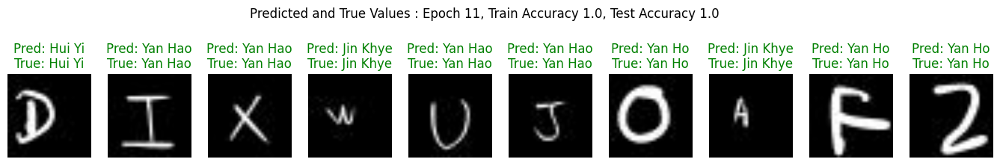



Epoch :  12


Training loss for step 20: 0.0001: 100%|██████████ | 21/21


Train loss :   0.0002, Validation loss :   0.0137, Train Accuracy :  1.000, Test Accuracy :  1.000



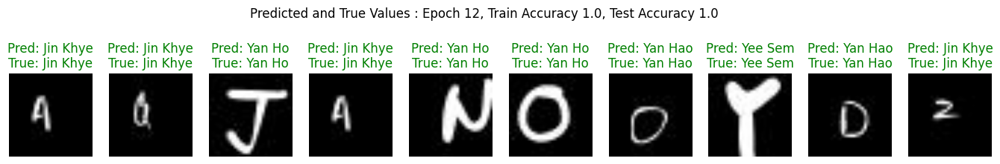



Epoch :  13


Training loss for step 20: 0.0002: 100%|██████████ | 21/21


Train loss :   0.0002, Validation loss :   0.0135, Train Accuracy :  1.000, Test Accuracy :  1.000



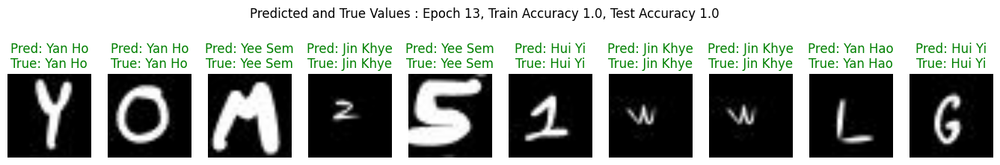



Epoch :  14


Training loss for step 20: 0.0009: 100%|██████████ | 21/21


Train loss :   0.0002, Validation loss :   0.0129, Train Accuracy :  1.000, Test Accuracy :  1.000



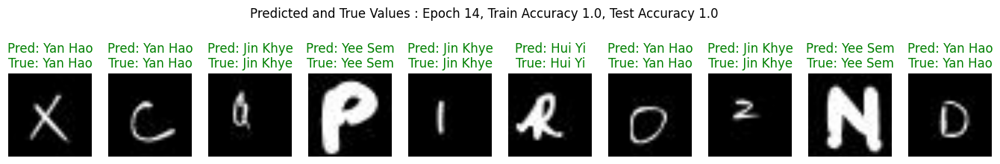



Epoch :  15


Training loss for step 20: 0.0000: 100%|██████████ | 21/21


Train loss :   0.0001, Validation loss :   0.0134, Train Accuracy :  1.000, Test Accuracy :  1.000



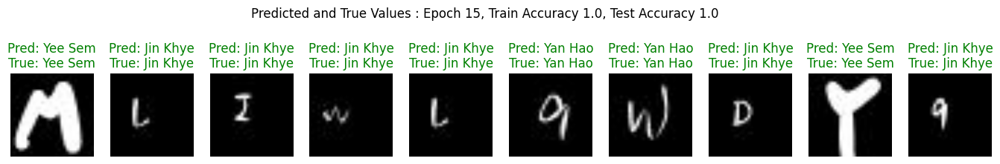

In [54]:
history = train_model(inceptionv3_model,train_dataset,test_dataset,epochs = 15)

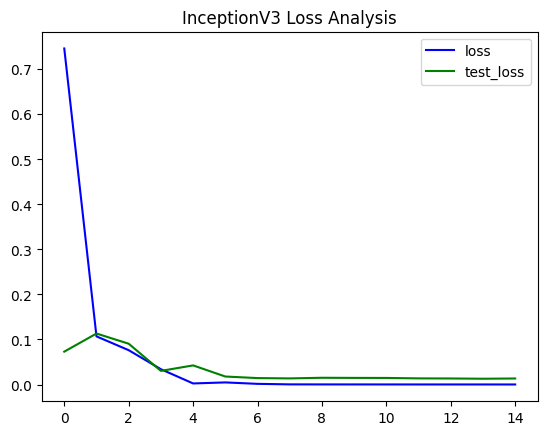

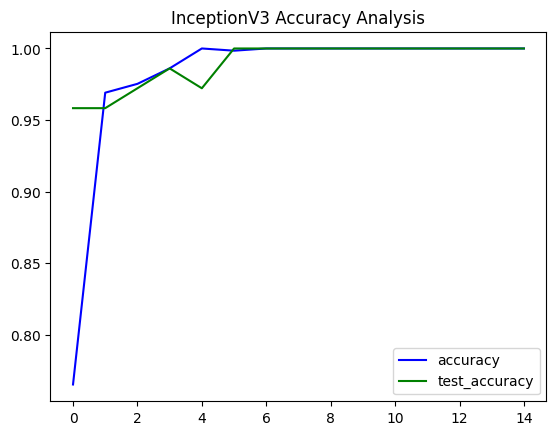

In [55]:
plot_metrics(history,'loss','InceptionV3 Loss Analysis')
print()
plot_metrics(history,'accuracy','InceptionV3 Accuracy Analysis')

1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 25ms/step


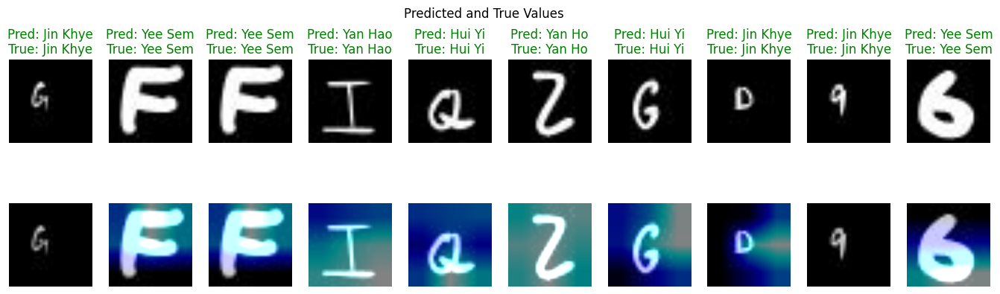

In [88]:
images_to_plot,y_pred_labels,y_true_labels = get_image_ypred_ytrue(inceptionv3_model,test_dataset)
display_images_with_cam(images_to_plot, y_pred_labels, y_true_labels, "Predicted and True Values", 10)

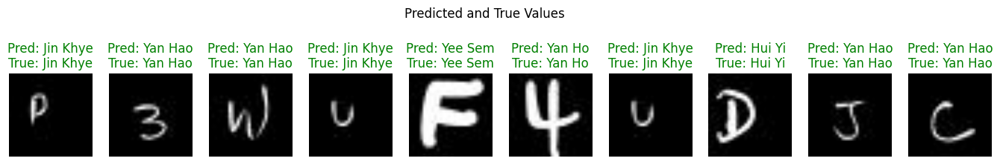

In [56]:
images_to_plot,y_pred_labels,y_true_labels = get_image_ypred_ytrue(inceptionv3_model,test_dataset)
display_images(images_to_plot, y_pred_labels, y_true_labels, "Predicted and True Values", 10)

1/1 [==============================] - 0s 23ms/step


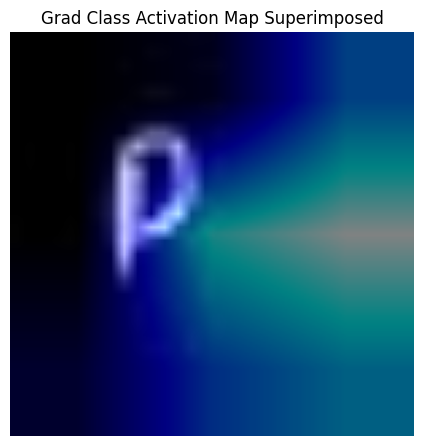

1/1 [==============================] - 0s 24ms/step


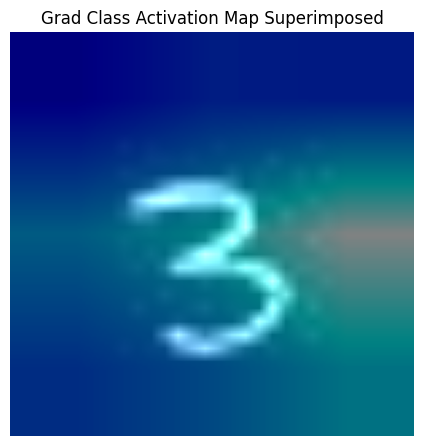

1/1 [==============================] - 0s 23ms/step


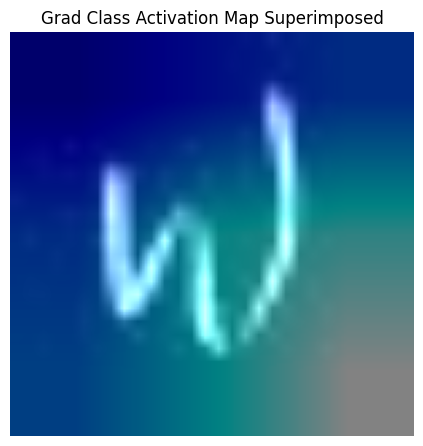

1/1 [==============================] - 0s 23ms/step


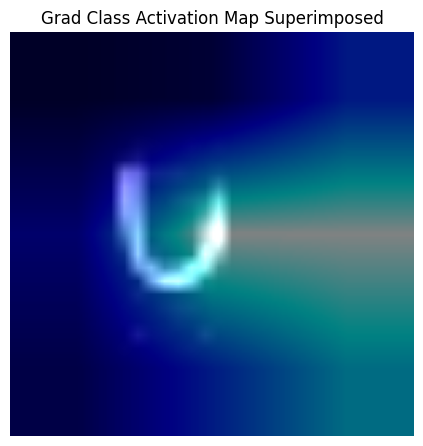

1/1 [==============================] - 0s 23ms/step


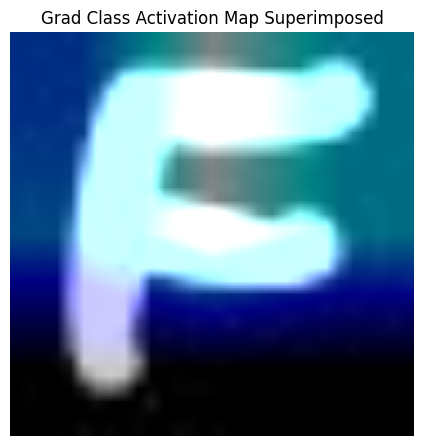

1/1 [==============================] - 0s 22ms/step


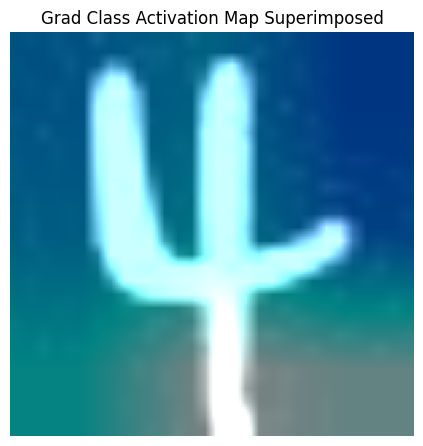

1/1 [==============================] - 0s 22ms/step


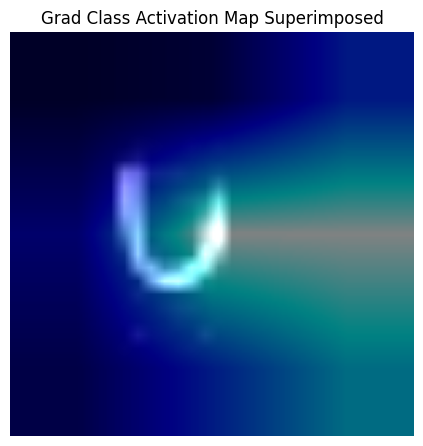

1/1 [==============================] - 0s 24ms/step


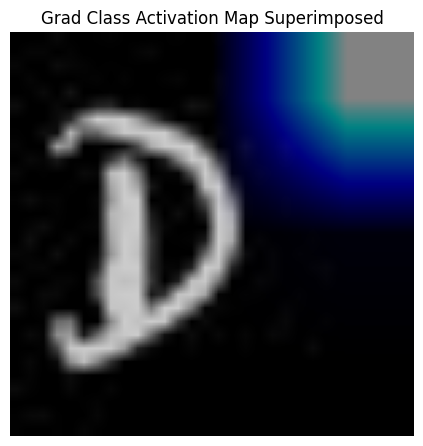

1/1 [==============================] - 0s 54ms/step


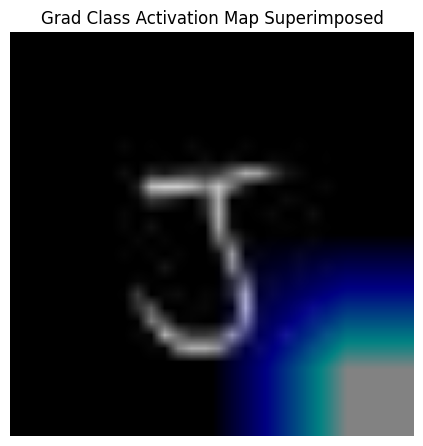

1/1 [==============================] - 0s 55ms/step


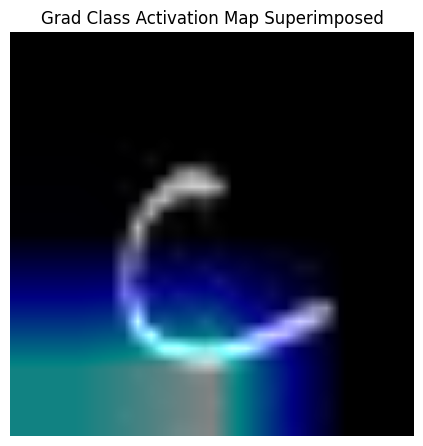

In [63]:
y_true = [label_mapping[item] for item in y_true_labels]
for sample_image,sample_label in zip(images_to_plot,y_true):
  show_sample(inceptionv3_model,sample_image,sample_label,layer_name = 'mixed10')

# Siamese Network (Ignore)

# Dataset Preparation

In [ ]:
label_mapping = {'Yan Ho' : 0,'Jin Khye' : 1,'Hui Yi' : 2,'Yee Sem' : 3,'Yan Hao' : 4}

train_siamese = train.copy()
test_siamese = test.copy()

train_siamese['one hot owner'] = train_siamese['Owner'].map(label_mapping)
test_siamese['one hot owner'] = test_siamese['Owner'].map(label_mapping)

train_siamese.head()

,Filename,Filepath,Owner,one hot owner
81,Jin Khye_crop_6_9.jpg,/content/output_crops/Jin Khye_crop_6_9.jpg,Jin Khye,1
382,Yan Ho_crop_7_10.jpg,/content/output_crops/Yan Ho_crop_7_10.jpg,Yan Ho,0
148,Hui Yi_crop_0_4.jpg,/content/output_crops/Hui Yi_crop_0_4.jpg,Hui Yi,2
536,Yan Hao_crop_8_8.jpg,/content/output_crops/Yan Hao_crop_8_8.jpg,Yan Hao,4
581,Yee Sem_crop_0_5.jpg,/content/output_crops/Yee Sem_crop_0_5.jpg,Yee Sem,3


In [ ]:
import random

def create_pairs(images,owners):
  pairs = []
  labels = []

  # Extract the min length of dataset among the owners
  n = min([len(owners[i]) for i in range(5)]) - 1

  for d in range(5):
    for i in range(n):
      pos_1,pos_2 = owners[d][i],owners[d][i+1]
      pairs += [[images[pos_1],images[pos_2]]]
      # Generate the random integer between 0 - 4
      inc = random.randrange(0,4)
      dn = (d + inc) % 5
      neg_1,neg_2 = owners[d][i],owners[dn][i+1]
      pairs += [[images[neg_1],images[neg_2]]]
      labels += [1,0]

  return np.array(pairs),np.array(labels)

def create_pairs_on_set(images,labels):
  owner_indices = [np.where(labels == i)[0] for i in range(5)]
  pairs,y = create_pairs(images,owner_indices)
  y = y.astype('float32')
  return pairs,y

def show_image(image):
  plt.figure()
  plt.imshow(image)
  plt.colorbar()
  plt.grid(False)
  plt.show()

# Load Images
def load_and_preprocess_image(file_path):
    # Read the image file as raw data
    img = tf.io.read_file(file_path)
    # Decode the raw data into a tensor
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.resize(img, [30, 30])
    img = tf.cast(img, tf.float32) / 255.0
    return img

In [ ]:
# Train dataset
siamese_train_image_paths = train_siamese['Filepath'].tolist()
siamese_train_label = np.array(train_siamese['one hot owner'])

# Test dataset
siamese_test_image_paths = test_siamese['Filepath'].tolist()
siamese_test_label =  np.array(test_siamese['one hot owner'])

# Load all images
siamese_train_images = train_images.copy()
siamese_test_images = test_images.copy()

train_pairs,y_train = create_pairs_on_set(siamese_train_images,siamese_train_label)
test_pairs,y_test = create_pairs_on_set(siamese_test_images,siamese_test_label)

# siamese_train_image_dataset = tf.data.Dataset.from_tensor_slices((siamese_train_images,siamese_train_label))
# siamese_test_image_dataset = tf.data.Dataset.from_tensor_slices((siamese_test_images,siamese_test_label))

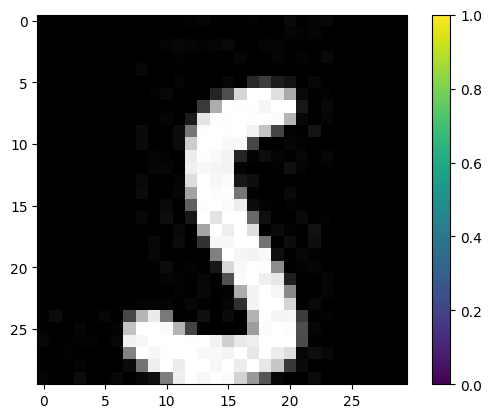

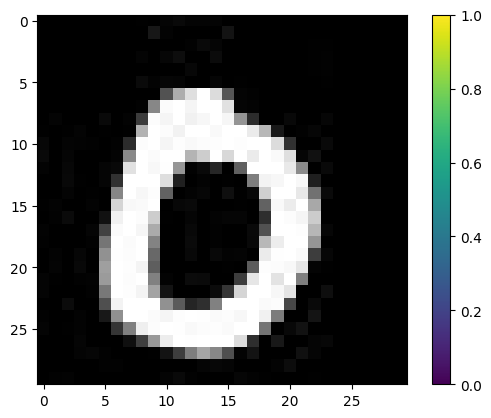

0.0


In [ ]:
# Array Index
pair_index = 3

# Show images at this index
show_image(train_pairs[pair_index][0])
show_image(train_pairs[pair_index][1])

print(y_train[pair_index])

  0%|           | 0/21
Training loss for step 0: 1.8420:   5%|▍          | 1/21


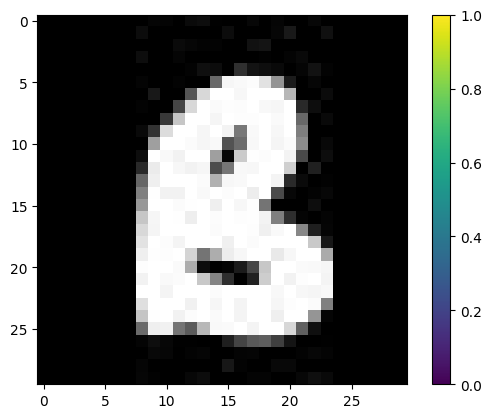

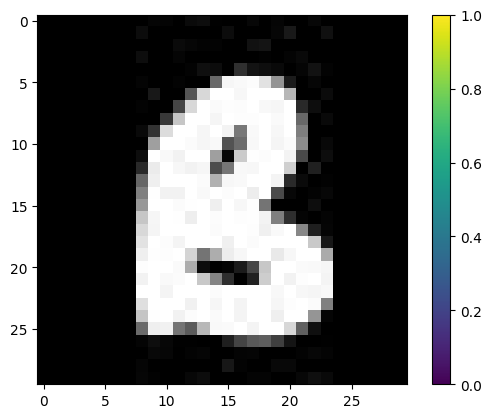

1.0



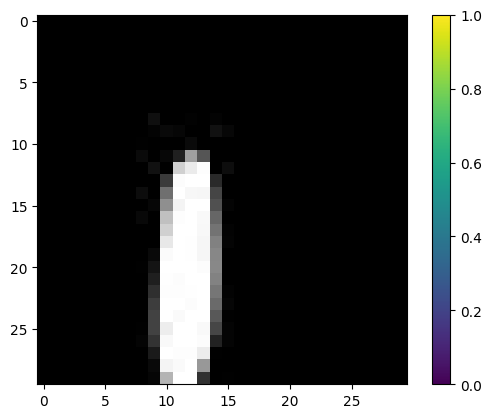

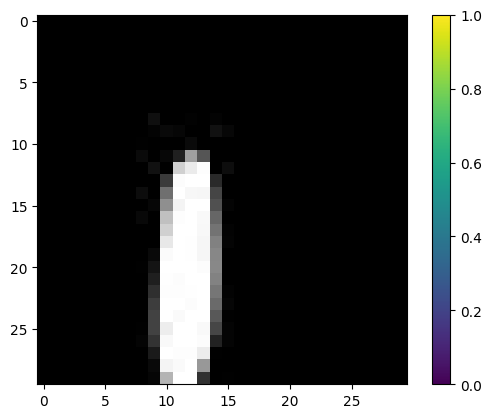

0.0


In [ ]:
# Print other pairs
show_image(train_pairs[:,0][0])
show_image(train_pairs[:,0][1])
print(y_train[0])

print()

show_image(test_pairs[:,1][0])
show_image(test_pairs[:,1][1])
print(y_test[1])

# Build the Model

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras import backend as K
from tensorflow.keras import layers,Model

In [ ]:
def initialize_ResNet50():
  feature_extractor = tf.keras.applications.resnet.ResNet50(
      input_shape = (240,240,3),
      include_top = False,
      weights = 'imagenet'
  )

  for layer in feature_extractor.layers:
    layer.trainable = False

  return feature_extractor

def siamase_owner_classifier(inputs):
  x = layers.GlobalAveragePooling2D()(inputs)
  x = layers.Flatten()(x)
  x = layers.Dense(1024,activation = 'relu')(x)
  x = layers.Dense(512,activation = 'relu')(x)
  x = tf.keras.layers.Dense(5,activation = 'softmax',name = 'owner classification')(x)

  return x

def siamese_base_network():
  inputs = layers.Input(shape = (30,30,3))
  x = layers.UpSampling2D(size = (8,8))(inputs)
  feature_extractor = initialize_ResNet50()(x)
  #x = layers.GlobalAveragePooling2D()(feature_extractor)

  return Model(inputs = inputs,outputs = feature_extractor)

def euclidean_distance(vects):
  x,y = vects
  sum_square = tf.math.reduce_sum(K.square(x - y),axis = 1,keepdims = True)
  return K.sqrt(K.maximum(sum_square,K.epsilon()))

def eucl_dist_output_shape(shapes):
  shape1,shape2 = shapes
  return (shape1[0],1)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 30, 30, 3)]       0         
                                                                 
 up_sampling2d_5 (UpSamplin  (None, 240, 240, 3)       0         
 g2D)                                                            
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
Total params: 23587712 (89.98 MB)
Trainable params: 0 (0.00 Byte)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


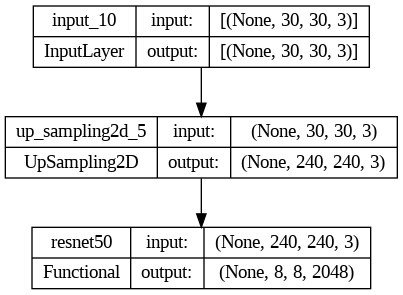

In [ ]:
base_network = siamese_base_network()
base_network.summary()
plot_model(base_network,show_shapes=True, show_layer_names=True)

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 left input (InputLayer)     [(None, 30, 30, 3)]          0         []                            
                                                                                                  
 right input (InputLayer)    [(None, 30, 30, 3)]          0         []                            
                                                                                                  
 model_4 (Functional)        (None, 8, 8, 2048)           2358771   ['left input[0][0]',          
                                                          2          'right input[0][0]']         
                                                                                                  
 output_layer (Lambda)       (None, 1, 8, 2048)           0         ['model_4[0][0]',       

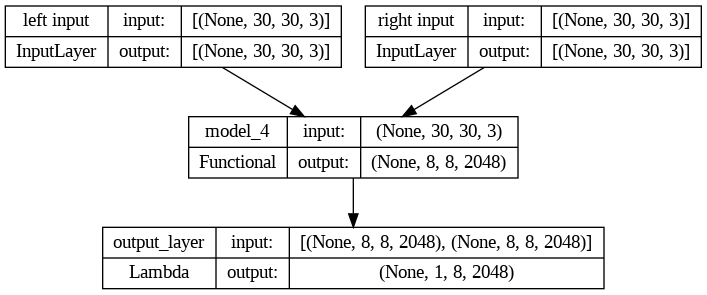

In [ ]:
def siamese_network_model():
  # Create left input and point to the siamase base network
  input_a = layers.Input(shape = (30,30,3),name = 'left input')
  vertor_output_a = base_network(input_a)

  # Create right input and point to the siamase base network
  input_b = layers.Input(shape = (30,30,3),name = 'right input')
  vertor_output_b = base_network(input_b)

  # Measure the similarity of the two vector outputs
  output = tf.keras.layers.Lambda(euclidean_distance,name = 'output_layer',output_shape = eucl_dist_output_shape)([vertor_output_a , vertor_output_b])

  # Specify the inputs and outputs model
  model = Model(inputs = [input_a,input_b],outputs = output)

  return model

siamase_model = siamese_network_model()

siamase_model.summary()

# Plot the model graph
plot_model(siamase_model,show_shapes = True,show_layer_names = True)

# Train Siamase Model

In [ ]:
# Custom loss function
def contrastive_loss_with_margin(margin):
  def contrastive_loss(y_true,y_pred):
    square_pred = K.square(y_pred)
    margin_square = K.square(K.maximum(margin - y_pred,0))
    return K.mean(y_true * square_pred + (1 - y_true) * margin_square)

  return contrastive_loss

siamase_model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
    loss = contrastive_loss_with_margin(margin = 1),
)

# Train the model
history = siamase_model.fit(
    [train_pairs[:, 0], train_pairs[:, 1]],
    y_train,
    batch_size= 1,
    validation_data=([test_pairs[:, 0], test_pairs[:, 1]], y_test),
    epochs=15
)

# Siamese Network Model Evaluation

In [ ]:
def compute_accuracy(y_true,y_pred):
  pred = y_pred.ravel() < 0.5
  return np.mean(pred == y_true)

In [ ]:
loss = siamase_model.evaluate(x=[test_pairs[:,0],test_pairs[:,1]], y= y_test)

y_pred_train = siamase_model.predict([train_pairs[:,0],train_pairs[:,1]])
train_accuracy = compute_accuracy(y_train,y_pred_train)

y_pred_test = siamase_model.predict([test_pairs[:,0],test_pairs[:,1]])
test_accuracy = compute_accuracy(y_test,y_pred_test)

print("Loss : ",loss)
print("Training accuracy : ",train_accuracy)
print("Testing  accuracy : ",test_accuracy)

In [ ]:
def plot_metrics(metric_name, title, ylim=5):
    plt.title(title)
    plt.ylim(0,ylim)
    plt.plot(history.history[metric_name],color='blue',label=metric_name)
    plt.plot(history.history['val_' + metric_name],color='green',label='val_' + metric_name)


plot_metrics(metric_name='loss', title="Loss")